# plotly

Example https://plot.ly/python/line-and-scatter/

Cheat Sheet https://images.plot.ly/plotly-documentation/images/python_cheat_sheet.pdf

Color Scale https://plot.ly/ipython-notebooks/color-scales/

In [1]:
import plotly.offline as ply
import plotly.graph_objs as go
from plotly.tools import FigureFactory as FF
%matplotlib inline

In [2]:
ply.init_notebook_mode(connected=True)

In [3]:
# Create random data with numpy
import numpy as np

N = 1000
random_x = np.random.randn(N)
random_y = np.random.randn(N)

# Create a trace
trace = go.Scatter(
    x = random_x,
    y = random_y,
    mode = 'markers',
)

data = [trace]
ply.iplot(data)

In [4]:
#Speed UP Scattergl
import plotly.plotly as py
import plotly.graph_objs as go
import numpy as np

N = 100000
trace = go.Scattergl(
    x = np.random.randn(N),
    y = np.random.randn(N),
    mode = 'markers',
    marker = dict(
        color = '#FFBAD2',
        opacity = 0.5,
        line = dict(width = 1)
    )
)

layout = go.Layout(
    title='Sampled Results',
    xaxis=dict(
        title='Valuex'
    ),
    yaxis=dict(
        title='Valuey'
    ),
    bargap=0.2,
    bargroupgap=0.1
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
ply.iplot(fig, filename='compare_webgl')

In [5]:
x1 = np.random.randn(100)-2  
x2 = np.random.randn(100)  
x3 = np.random.randn(100)+2  
hist_data = [x1, x2, x3]
trace1 = go.Histogram(x=x1, 
                     histnorm='probability', 
                     name='x1',
                     xbins=dict(start= np.min(x1), end=np.max(x1), size=0.5),
                     marker=dict(color='blue', opacity = 0.6,),                     
                    )

trace2 = go.Histogram(x=x2, 
                     histnorm='probability', 
                     name='x2',
                     xbins=dict(start= np.min(x2), end=np.max(x2), size=0.5),
                     marker=dict(color='red', opacity = 0.6,),                     
                    )
trace3 = go.Histogram(x=x3, 
                     histnorm='probability', 
                     name='x3',
                     xbins=dict(start= np.min(x3), end=np.max(x3), size=0.5),
                     marker=dict(color='green', opacity = 0.6,),                     
                    )

layout = go.Layout(
    title='Sampled Results',
    barmode='overlay',
    xaxis=dict(title='Value'),
    yaxis=dict(title='Count'),
    bargap=0.02,
    bargroupgap=0.01
)

data = [trace1, trace2, trace3]
fig = go.Figure(data=data, layout=layout)
ply.iplot(fig)

In [6]:
# Create random data with numpy
import numpy as np

N = 100
random_x = np.linspace(0, 1, N)
random_y0 = np.random.randn(N)+5
random_y1 = np.random.randn(N)
random_y2 = np.random.randn(N)-5

# Create traces
trace0 = go.Scatter(
    x = random_x,
    y = random_y0,
    mode = 'markers',
    name = 'markers',
    marker=dict(
        color = '#FFBAD2',
        opacity = 0.8,
    )
)
trace1 = go.Scatter(
    x = random_x,
    y = random_y1,
    mode = 'lines+markers',
    name = 'lines+markers'
)
trace2 = go.Scatter(
    x = random_x,
    y = random_y2,
    mode = 'lines',
    name = 'lines'
)

data = [trace0, trace1, trace2]
ply.iplot(data, filename='scatter-mode')

In [7]:
def spiral(th):
    a = 1.120529
    b = 0.306349
    r = a*np.exp(-b*th)
    return (r*np.cos(th), r*np.sin(th))

nspiral = 2 # number of spiral loops

th = np.linspace(-np.pi/13,2*np.pi*nspiral,1000); # angle
(x,y) = spiral(th)

# shift the spiral north so that it is centered
yshift = (1.6 - (max(y)-min(y)))/2

s = dict(x= -x+x[0], y= y-y[0]+yshift,
     line =dict(color='white',width=3)) 

# Build the rectangles as a heatmap
# specify the edges of the heatmap squares
phi = ( 1+np.sqrt(5) )/2.
xe = [0, 1, 1+(1/(phi**4)), 1+(1/(phi**3)), phi]
ye = [0, 1/(phi**3),1/phi**3+1/phi**4,1/(phi**2),1]

z = [ [13,3,3,5],
      [13,2,1,5],
      [13,10,11,12],
      [13,8,8,8]
    ]

hm = dict(x = np.sort(xe),
          y = np.sort(ye)+yshift,
          z = z,
          type = 'heatmap',
          colorscale = 'Viridis')

axis_template = dict(range = [0,1.6], autorange = False,
             showgrid = False, zeroline = False,
             linecolor = 'black', showticklabels = False,
             ticks = '' )

layout = dict( margin = dict(t=200,r=200,b=200,l=200),
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 700, height = 700,
    autosize = False )

figure = dict(data=[s, hm],layout=layout)

ply.iplot(figure, filename='golden spiral')

# mpld3

After fixing error https://stackoverflow.com/questions/48015030/mpld3-with-python-error 

See official demo https://mpld3.github.io/notebooks/mpld3_demo.html

In [8]:
import mpld3
mpld3.enable_notebook()

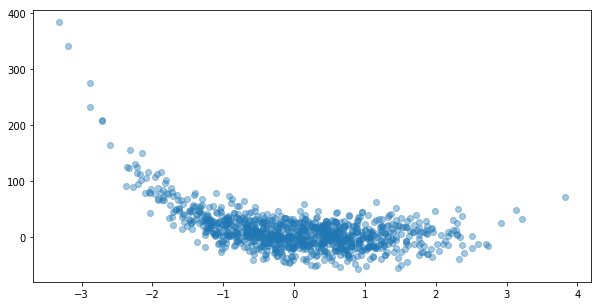

In [9]:
%matplotlib inline
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt
import numpy as np
size = 1000
X = np.random.normal(size=size, scale=1)
X = np.sort(X)
y =  (X-1)**2+(X-1)**4+ np.random.normal(size=size, scale=20)

figsize(10,5)
plt.scatter(X, y, alpha=0.4)

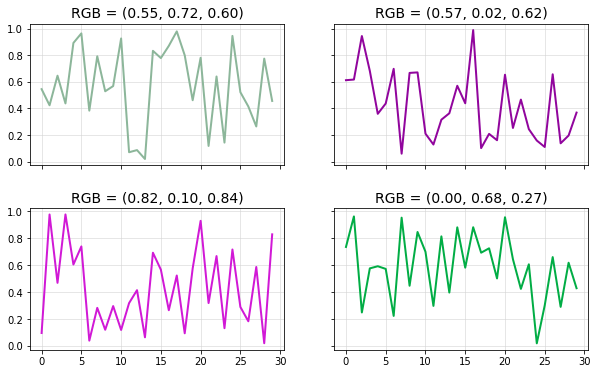

In [10]:
# multiple subplots, shared axes
fig, ax = plt.subplots(2, 2, figsize=(10, 6),sharex='col', sharey='row')
fig.subplots_adjust(hspace=0.3)

np.random.seed(0)

for axi in ax.flat:
    color = np.random.random(3)
    axi.plot(np.random.random(30), lw=2, c=color)
    axi.set_title("RGB = ({0:.2f}, {1:.2f}, {2:.2f})".format(*color),
                  size=14)
    axi.grid(color='lightgray', alpha=0.7)

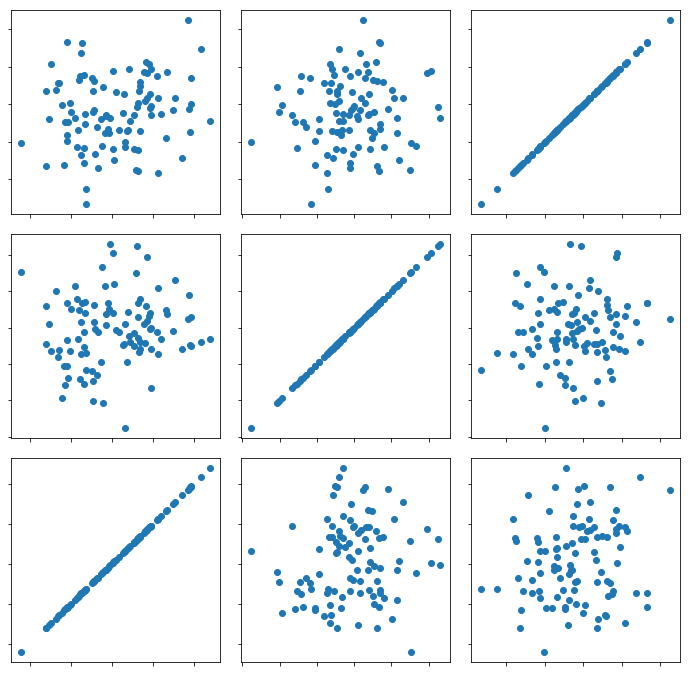

In [11]:
from mpld3 import plugins

fig, ax = plt.subplots(3, 3, figsize=(12, 12))
fig.subplots_adjust(hspace=0.1, wspace=0.1)
ax = ax[::-1]

X = np.random.normal(size=(3, 100))
for i in range(3):
    for j in range(3):
        ax[i, j].xaxis.set_major_formatter(plt.NullFormatter())
        ax[i, j].yaxis.set_major_formatter(plt.NullFormatter())
        points = ax[i, j].scatter(X[j], X[i])
plugins.connect(fig, plugins.LinkedBrush(points))        

# Ipywidget

In [12]:
import numpy as np
def get_data(alpha):
    size = 1000
    X = np.random.normal(size=size, scale=1)
    X = np.sort(X)
    y =  (X-1)**2 + alpha*np.random.normal(size=size, scale=1)
    return X, y

In [13]:
import ipywidgets as widgets

@widgets.interact(alpha=(-5, 5, 0.1))
def plot_by_alpha(alpha):
    X,y = get_data(alpha)

    # Create a trace
    trace = go.Scatter(
        x = X,
        y = y,
        mode = 'markers',
    )

    layout = go.Layout(
        title='sampling alpha = %s'%(alpha),
        xaxis=dict(title='X'),
        yaxis=dict(title='y'),
    )

    data = [trace]
    figure = dict(data=data, layout=layout)
    ply.iplot(figure)

interactive(children=(FloatSlider(value=0.0, description='alpha', max=5.0, min=-5.0), Output()), _dom_classes=('widget-interact',))

In [14]:
size = widgets.IntSlider(
    value=100,
    min=0,
    max=10000,
    step=1,
    description='Sample Size:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

scale = widgets.FloatSlider(
    value=1,
    min=-10,
    max=10,
    step=0.1,
    description='Scale:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.1f',
)

#check box
label = widgets.Checkbox(
    value=False,
    description='Use Label',
    disabled=False
)

#dropdown
color = widgets.Dropdown(
    options={'Blue': "b", 'Red': "r", 'Green': "g"},
    value="b",
    description='Color: ',
)

#toggle btn
color2 = widgets.ToggleButtons(
    options={'Blue':"b", 'Red':"r", 'Green':"g"},
    description='Color:',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
#     icons=['check'] * 3
)

color3 = widgets.ColorPicker(
    concise=False,
    description='Pick a color',
    value='blue',
    disabled=False
)

@widgets.interact(size=size, n=scale, label=label, color=color3, color2=color2)
def test_plot(n, size, label, color, color2):
    maxmin = 1000
    X = np.linspace(-maxmin, maxmin, size)
    y = X ** n
    X = X[y == y]
    y = y[y == y]
    plt.scatter(X , y, color=color, alpha = 0.4)
    plt.xlim([-maxmin, maxmin])
    plt.ylim([np.min(y)- 10, np.max(y)+ 10])
    if label == True:
        plt.title("Size %s"%(size))         
    plt.show()
        
    plt.scatter(y , X, color=color2, alpha = 0.4)
    plt.ylim([-maxmin, maxmin])
    plt.xlim([np.min(y)- 10, np.max(y)+ 10])
    if label == True:
        plt.title("Size %s"%(size))                 
    plt.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='Scale:', max=10.0, min=-10.0, readout_format='.1f'), IntSlider(value=100, continuous_update=False, description='Sample Size:', max=10000), Checkbox(value=False, description='Use Label'), ColorPicker(value='blue', description='Pick a color'), ToggleButtons(description='Color:', options={'Blue': 'b', 'Red': 'r', 'Green': 'g'}, value='b'), Output()), _dom_classes=('widget-interact',))